# Visualize

> Data visualization

In [ ]:
#| default_exp visualize

In [ ]:
#| hide
from nbdev.showdoc import *

In [ ]:
#| export
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import torchvision

from fastai.vision.all import plt, ifnone

from bioMONAI.core import torchTensor, tensor, delegates, torch_from_numpy, hasattrs, img2float, cells3d
# from bioMONAI.io import tiff2torch

In [ ]:

# load sample data
data4D = img2float(cells3d())
data = data4D[:, 1, :, :] # load the nuclei channel

## Display 2D images

Function to quickly display 2D images

In [ ]:
#| export
def plot_image(values, # A 2D or 3D array of pixel values representing the image.
               ):
    """
    Plot a 2D image or the central slice of a 3D image using Matplotlib. 
    The function assumes that 'values' is a 2D or 3D array representing an image, typically in grayscale.
    """
    # Check if the input is 3D
    if values.ndim == 3:
        # Get the central slice along the first axis
        central_slice = values[values.shape[0] // 2]
    else:
        central_slice = values
    
    # Create a figure with Matplotlib
    fig = plt.figure()
    
    # Add an axis to the figure, which will be used for plotting the image
    ax = fig.add_subplot(111)
    
    # Display the image using imshow. The np.flipud function is applied to flip the array vertically, 
    # which is necessary because Matplotlib's default orientation might differ from NumPy's or Plotly's.
    ax.imshow(np.flipud(central_slice), cmap='gray')
    
    # Turn off axis numbers and ticks for a cleaner visual appearance of the image
    ax.axis('off')
    
    # Display the figure with all defined elements
    plt.show()

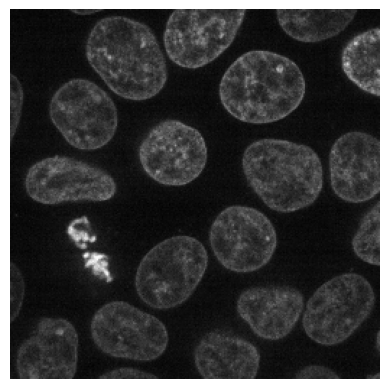

In [ ]:
# Example usage:
plot_image(data[30])


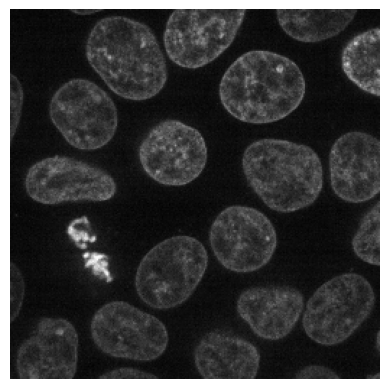

In [ ]:
plot_image(data)

## Display Multichannel images

Function to display RGB and multichannel images

In [ ]:
#| export
@delegates(plt.Axes.imshow, keep=True, but=['shape', 'imlim'])
def show_multichannel(img,                  # A tensor or numpy array representing a multi-channel image.
                      ax=None,              # The Matplotlib axis to use for plotting.
                      figsize=None,         # The size of the figure.
                      title=None,           # The title of the image.
                      max_slices=3,         # The maximum number of slices to display.
                      ctx=None,             # The context to use for plotting.
                      layout='horizontal',  # The layout type: 'horizontal', 'square', or 'multirow'.
                      num_cols=3,           # The number of columns for the 'multirow' layout. Ignored for other layouts.
                      **kwargs):
    """
    Show multi-channel CYX image with options for horizontal, square, or multi-row layout.
    """
    # Check if the image has the as_tensor attribute
    if hasattr(img, 'as_tensor'):
        # If it has as_tensor, convert it to tensor and then to numpy
        img_tensor = img.as_tensor().cpu().numpy()
    else:
        # Attempt to convert img to a numpy array directly
        try:
            img_tensor = np.array(img)
        except Exception as e:
            raise TypeError("The provided image cannot be converted to a tensor or numpy array.") from e

    # Set figure size if not provided
    if figsize is None:
        figsize = (5, 5) if img_tensor.shape[0] == 3 else (8, 4)  # Larger for multi-channel

    # Create axis if not provided
    ax = ifnone(ax, ctx)
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)

    # Handle RGB images (C=3)
    if img_tensor.ndim == 3 and img_tensor.shape[0] == 3:  # CYX format, where C=3 (RGB)
        img_to_show = img_tensor.transpose(1, 2, 0)  # Convert from CYX (Channels, Y, X) to YXC (Height, Width, Channels)
        if max(img_to_show.flatten()) > 1.0:
            ax.imshow(img_to_show / 255, **kwargs)
        else:
            ax.imshow(img_to_show, **kwargs)

    # Handle multi-channel images (C≠3)
    else:
        num_channels = img_tensor.shape[0]
        
        # Limit number of channels to max_slices
        if num_channels > max_slices:
            middle_slices = range(num_channels // 2 - max_slices // 2, num_channels // 2 + max_slices // 2)
            img_tensor = img_tensor[list(middle_slices)]

        if layout == 'square':
            # Calculate the grid size
            grid_size = int(np.ceil(np.sqrt(img_tensor.shape[0])))
            grid_canvas = np.zeros((grid_size * img_tensor.shape[1], grid_size * img_tensor.shape[2]))
            for idx, channel in enumerate(img_tensor):
                row = idx // grid_size
                col = idx % grid_size
                grid_canvas[row * img_tensor.shape[1]:(row + 1) * img_tensor.shape[1],
                            col * img_tensor.shape[2]:(col + 1) * img_tensor.shape[2]] = channel
            img_to_show = grid_canvas

        elif layout == 'multirow':
            num_rows = int(np.ceil(num_channels / num_cols))
            row_height = img_tensor.shape[1]
            col_width = img_tensor.shape[2]
            multirow_canvas = np.zeros((num_rows * row_height, num_cols * col_width))

            for idx, channel in enumerate(img_tensor):
                row = idx // num_cols
                col = idx % num_cols
                multirow_canvas[row * row_height:(row + 1) * row_height,
                                col * col_width:(col + 1) * col_width] = channel
            img_to_show = multirow_canvas

        else:  # Horizontal layout
            img_to_show = np.concatenate([img_tensor[c] for c in range(img_tensor.shape[0])], axis=1)

        # Display the image as grayscale
        ax.imshow(img_to_show, **kwargs)

    # Set title for the image
    if title:
        ax.set_title(title)

    # Turn off the axis for a cleaner display
    ax.axis('off')

    return ax



(2, 256, 256)


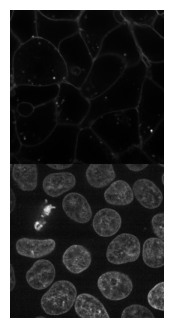

In [ ]:
print(data4D[35].shape)
show_multichannel(data4D[35], cmap='gray', layout='multirow', num_cols=1);

## Display 3D images

Function to display 3D images

In [ ]:
#| export
# Utility function for determining figure bounds
def _fig_bounds(x):
    r = x//8
    return min(15, max(1,r))

In [ ]:
#| export
def mosaic_image_3d(t: (np.ndarray, torchTensor),   # 3D image to plot
                  axis: int = 0,                    # axis to split 3D array to 2D images
                  figsize: tuple = (15,15),         # size of the figure
                  cmap: str = 'gray',               # colormap to use
                  nrow: int = 10,                   # number of images per row
                  alpha = 1.,                       # transparency of the image
                  return_grid = False,              # return the grid for further processing
                  add_to_existing = False,          # add to existing figure
                  **kwargs):
    '''
    Plots 2D slices of a 3D image alongside a prior specified axis.
    '''
    if isinstance(t, np.ndarray): 
        t = tensor(t)
    
    if t.device.type == 'cuda': 
        t = t.cpu()
    
    if t.ndim < 3 or t.ndim > 4:
         raise TypeError('Object is not a rank 3 tensor but a rank {} tensor'.format(t.ndim ))
    if t.ndim == 4:
        t = t[0]

    if axis == 1: 
        t = np.transpose(t, (1, 0, 2))
    elif axis == 2: 
        t = np.transpose(t, (2, 0, 1))

    if t.min() < 0.:
        t = t - t.min()  # shift pixel values to positive range, otherwise the negative values will be clipped.

    t = t.unsqueeze(1)/t.max()  # rescale the images, makes for a nicer plot
    grid = torchvision.utils.make_grid(t, nrow=nrow)

    if return_grid:
        return grid

    if figsize is None:
        figsize = (_fig_bounds(t.shape[2]), _fig_bounds(t.shape[3]))

    if not add_to_existing:
        plt.figure(figsize=figsize)

    plt.imshow(grid[0,:,:], cmap=cmap, alpha=alpha)
    plt.axis('off')

In [ ]:
#| export
@delegates(plt.Axes.imshow, keep=True, but=['shape', 'imlim'])
def show_images_grid(images,            # A list of images to display.
                     ax=None,           # The Matplotlib axis to use for plotting.
                     ncols=10,          # The number of columns in the grid.
                     figsize=None,      # The size of the figure.
                     title=None,        # The title of the image.
                     spacing=0.02,      # The spacing between subplots.
                     max_slices=3,      # The maximum number of slices to display.
                     ctx=None,          # The context to use for plotting.
                     **kwargs):
    """
    Show a list of images arranged in a grid.

    Returns:
    - axes: matplotlib axes containing the grid of images.
    """

    # Ensure images is a list
    images = list(images)

    # Compute number of rows needed based on number of columns and images
    n_images = len(images)
    nrows = (n_images - 1) // ncols + 1

    # Compute figure size if not provided
    if figsize is None:
        fig_width = ncols * (1 + spacing) - spacing
        fig_height = nrows * (1 + spacing) - spacing
        figsize = (fig_width, fig_height)

    ax = ifnone(ax,ctx)
    
    if ax is None:
        fig, ax = plt.subplots(nrows, ncols, figsize=figsize)
        fig.subplots_adjust(wspace=spacing, hspace=spacing) # Adjust spacing between subplots
    ax = np.atleast_2d(ax)

    # Turn off axes for all subplots
    for axis in ax.flatten():
        axis.axis('off')

    # Iterate over images and corresponding axes
    for i, (im, axis) in enumerate(zip(images, ax.flatten())):
        # Convert input to numpy array if necessary
        if isinstance(im, np.ndarray):
            im_to_show = im
        elif hasattrs(im, ('data', 'cpu', 'permute')):
            im_to_show = im.data.cpu()
            if im_to_show.ndim == 3:
                num_slices = im_to_show.shape[0]
                if num_slices < max_slices:
                    im_to_show = np.concatenate([im_to_show[i] for i in range(num_slices)], axis=1)
                else:
                    # showing middle slice
                    im_to_show = im_to_show[num_slices // 2]
            elif im_to_show.ndim == 4:
                im_to_show = im_to_show[0]
        else:
            im_to_show = array(im)

        # Display image on current axes
        axis.imshow(im_to_show, **kwargs)
        if title is not None and i < len(title):
            axis.set_title(title[i])

    # Hide unused axes
    for axis in ax.flatten()[n_images:]:
        axis.set_visible(False)

    return ax

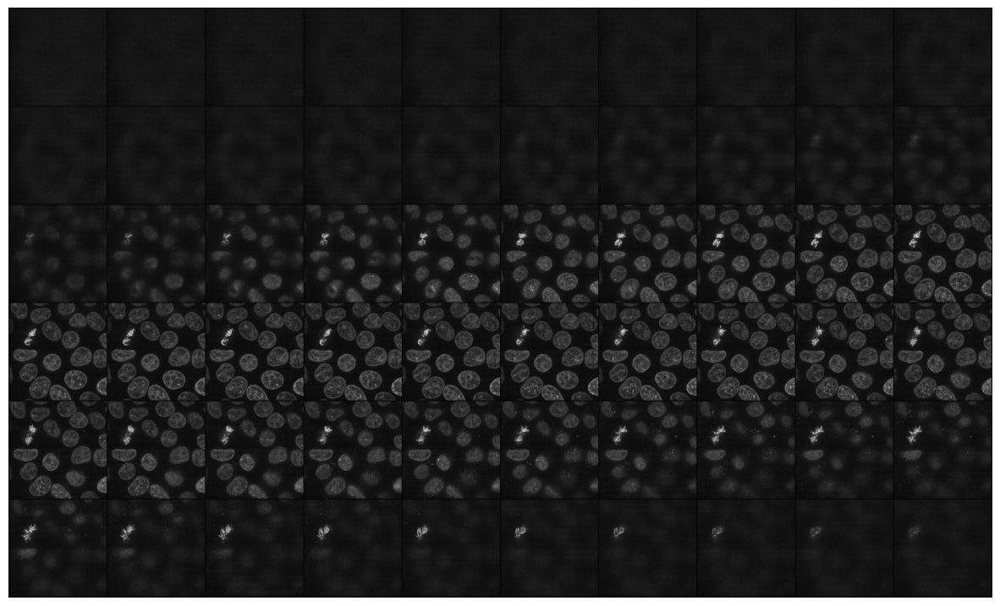

In [ ]:
mosaic_image_3d(torch_from_numpy(data), figsize=None)

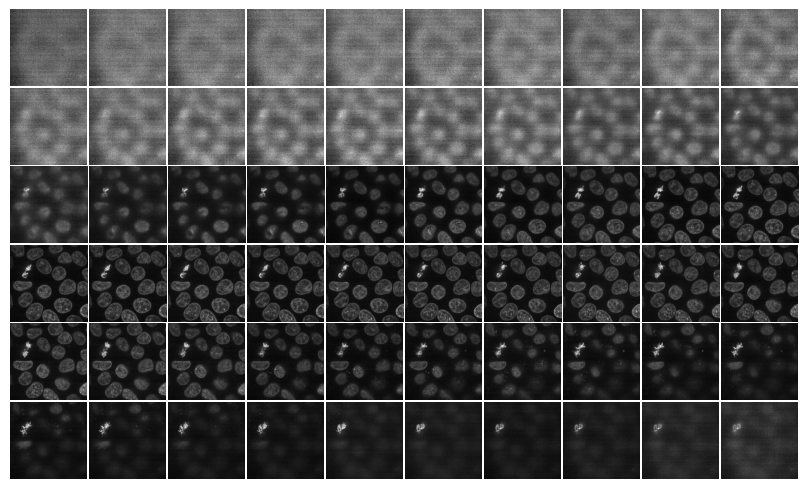

In [ ]:
show_images_grid(data, cmap='gray');

## Show slices

In [ ]:
#| export
def show_plane(ax,                  # The axis object to display the slice on.
               plane,               # A 2D numpy array representing the slice of the image tensor.
               cmap="gray",         # Colormap to use for displaying the image.
               title=None,          # Title for the plot.
               lines=None,          # A list of indices where dashed lines should be drawn on the plane.
               linestyle='--',      # The style of the dashed lines.
               linecolor='white',   # The color of the dashed lines.
               ):
    """
    Display a slice of the image tensor on a given axis with optional dashed lines.
    """
    ax.imshow(plane, cmap=cmap)
    ax.set_axis_off()
    
    if title:
        ax.set_title(title)
    
    # Add dashed lines if specified
    if lines is not None:
        ax.axhline(lines[0], color=linecolor, linestyle=linestyle)
        ax.axvline(lines[1], color=linecolor, linestyle=linestyle)


In [ ]:
#| export
def visualize_slices(data,          # A 3D numpy array representing the image tensor.
                     planes=None,   # A tuple containing the indices of the planes to visualize.
                     showlines=True,# Whether to show dashed lines on the planes, rows, and columns.
                     **kwargs):
    """
    Visualize slices of a 3D image tensor along its planes, rows, and columns.
    """
    if planes:
        z, y, x = planes
    else:
        # Extract dimensions
        (z, y, x) = data.shape
        z = z // 2
        y = y // 2
        x = x // 2
    
    # Create subplots
    _, (a, b, c) = plt.subplots(ncols=3, figsize=(15, 5))
    
    # Display slices along planes, rows, and columns
    if showlines:
        show_plane(a, data[z], title=f'Plane = {z}', lines=[y, x], **kwargs)
        show_plane(b, data[:, y, :], title=f'Row = {y}', lines=[z, x], **kwargs)
        show_plane(c, data[:, :, x], title=f'Column = {x}', lines=[z, y], **kwargs)
    else:
        show_plane(a, data[z], title=f'Plane = {z}')
        show_plane(b, data[:, y, :], title=f'Row = {y}')
        show_plane(c, data[:, :, x], title=f'Column = {x}')
    
    # Show the plot
    plt.show()


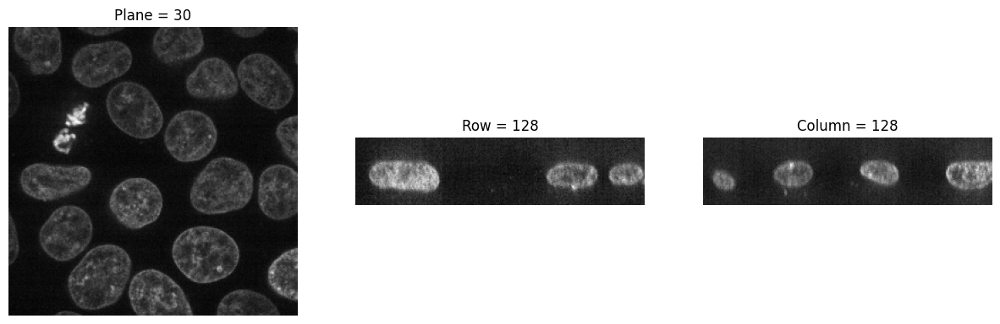

In [ ]:
visualize_slices(data, showlines=False)

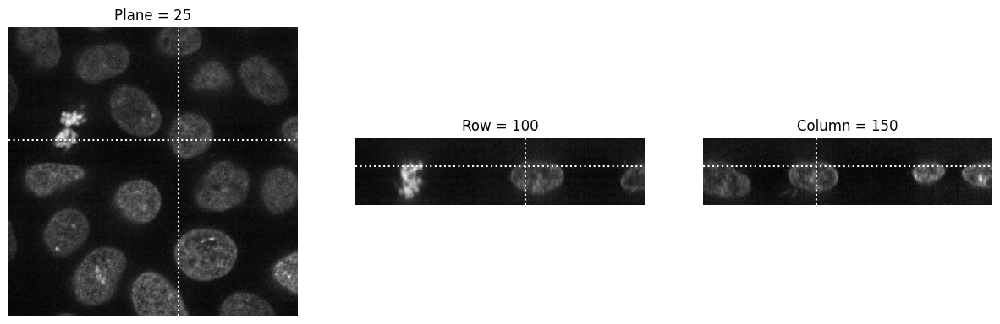

In [ ]:
visualize_slices(data, (25,100,150), linestyle=':')

In [ ]:
#| export
def slice_explorer(data,            # A 3D numpy array representing the image tensor.
                   order='CZYX',    # The order of dimensions in the data.
                   **kwargs):
    """
    Visualizes the provided data using Plotly's interactive imshow function with animation support.
    """

    # Handle 4D data with channel dimension
    if len(data.shape) == 4:
        target_order = 'ZCYX'
        # If data is already in 'ZCYX' order, no need to transpose
        if order != target_order:
            # Create a mapping from the current order to the target order
            current_order_indices = [order.index(dim) for dim in target_order]
            
            # Reorder the data to match 'ZCYX'
            data = np.transpose(data, current_order_indices)
    
        fig = px.imshow(
            data,
            animation_frame=0, 
            binary_string=True, 
            labels=dict(animation_frame="slice", facet_col='channel'), 
            facet_col=1
        )
    # Handle 3D data (no channel dimension)
    elif len(data.shape) == 3:
        fig = px.imshow(
            data,
            animation_frame=0, 
            binary_string=True, 
            labels=dict(animation_frame="slice")
        )
    else:
        raise ValueError("Input must be a 3D or 4D array.")

    # Remove tick labels from axes
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)
    
    # Set custom size for the plot
    fig.update_layout(**kwargs, title_x=0.5)
        
    # Display the plot using Plotly's show function
    pio.show(fig)

In [ ]:
slice_explorer(data4D, order='ZCYX', title='Cells 3D')

![static image of slice explorer](./data_examples/slice%20explorer.png)

In [ ]:
#| export
def plot_volume(values,             # A 3D array of pixel values representing the volume.
                opacity=0.1,        # Opacity level for the surfaces in the volume plot.
                min=None,            # Minimum threshold for the visualization.
                max=None,            # Maximum threshold for the visualization.
                surface_count=5,    # Number of surfaces to display in the volume plot.
                width=800,          # Width of the plotted figure.
                height=600,         # Height of the plotted figure.
                **kwargs            # Additional keyword arguments for Plotly figure customization.
                ):
    """
    Interactive visualization of a 3D volume using Plotly. The function assumes that 'values' is a 3D array representing the volume data.
    """
    # Generate coordinates based on the shape of the values array
    X, Y, Z = np.mgrid[0:values.shape[0], 0:values.shape[1], 0:values.shape[2]]
    if min is None:
        min = values.min()
    if max is None:
        max = values.max()
    
    # Create a Plotly figure with volume data
    fig = go.Figure(data=go.Volume(
        x=X.flatten(),
        y=Y.flatten(),
        z=Z.flatten(),
        value=values.flatten(),
        isomin=min, # Adjust the minimum threshold for visualization
        isomax=max, # Adjust the maximum threshold for visualization
        opacity=opacity, # needs to be small to see through all surfaces
        surface_count=surface_count, # needs to be a large number for good volume rendering
        **kwargs,
    ))
    
    # Update layout with specific width and height
    fig.update_layout(width=width, height=height) # Adjust these values as needed
    
    # Display the figure in a new window
    fig.show()

In [ ]:
plot_volume(data[:, 50:150, 50:150])

![static image of interactive 3D plot](./data_examples/plot_volume_example.png)

## Plots

In [ ]:
#| export
def plot_metrics(learn):
    """
    Plot a losses and metrics from a fastai Recorder.
    - Loss curves
    - Metrics curves
    - Best validation epoch markers
    """

    recorder = learn.recorder
    metric_names = recorder.metric_names[1:-1]  # remove epoch/time

    df = pd.DataFrame(recorder.values, columns=metric_names)
    epochs = np.arange(1, len(df)+1)

    loss_cols = [c for c in df.columns if "loss" in c]
    metric_cols = [c for c in df.columns if "loss" not in c]

    n_plots = 1 + len(metric_cols)
    fig, axes = plt.subplots(n_plots, 1, figsize=(7, 4*n_plots), sharex=True)

    if n_plots == 1:
        axes = [axes]

    # -------- Loss plot --------
    ax = axes[0]
    for col in loss_cols:
        ax.plot(epochs, df[col], marker="o", label=col)

    if "valid_loss" in df:
        best_epoch = df["valid_loss"].idxmin()
        ax.axvline(best_epoch+1, linestyle="--", alpha=0.6)
        ax.scatter(best_epoch+1, df["valid_loss"][best_epoch], s=80)

    ax.set_title("Training and Validation Loss")
    ax.set_ylabel("Loss")
    ax.legend()
    ax.grid(True)

    # -------- Metrics --------
    for i, metric in enumerate(metric_cols):
        ax = axes[i+1]

        ax.plot(epochs, df[metric], marker="o", label=metric)

        best_epoch = df[metric].idxmax()
        ax.axvline(best_epoch+1, linestyle="--", alpha=0.6)
        ax.scatter(best_epoch+1, df[metric][best_epoch], s=80)

        ax.set_title(metric)
        ax.set_ylabel(metric)
        ax.grid(True)

    axes[-1].set_xlabel("Epoch")

    plt.tight_layout()
    plt.show()

In [ ]:
#| export
def plot_intensity_histogram(
    image,
    threshold=None,
    mode=None,          # None, "greater", "lower"
    bins=256,
    per_channel=False,
    density=False,
    int_ticks=True,    
    int_y_ticks=False   
):
    """
    Plot intensity histogram of an image.
    """

    image = np.asarray(image)

    def filter_values(values):
        if threshold is None or mode is None:
            return values
        if mode == "greater":
            return values[values > threshold]
        elif mode == "lower":
            return values[values < threshold]
        else:
            raise ValueError("mode must be None, 'greater', or 'lower'")

    fig, ax = plt.subplots(figsize=(6, 4))

    # ---- Grayscale ----
    if image.ndim == 2:
        values = filter_values(image.ravel())
        ax.hist(values, bins=bins, color="#AA3111", alpha=0.9, density=density)
        ax.set_title("Grayscale Intensity Histogram")

    # ---- RGB ----
    elif image.ndim == 3 and image.shape[2] == 3:
        if per_channel:
            colors = ["red", "green", "blue"]
            for i, color in enumerate(colors):
                values = filter_values(image[..., i].ravel())
                ax.hist(
                    values,
                    bins=bins,
                    color=color,
                    alpha=0.5,
                    density=density,
                    label=f"{color.upper()} channel"
                )
            ax.legend()
            ax.set_title("RGB Intensity Histogram (Per Channel)")
        else:
            values = filter_values(image.ravel())
            ax.hist(values, bins=bins, color="gray", alpha=0.7, density=density)
            ax.set_title("RGB Combined Intensity Histogram")

    else:
        raise ValueError("Unsupported image shape")

    ax.set_xlabel("Intensity")
    ax.set_ylabel("Frequency")

    # ---- Force integer ticks if requested ----
    if int_ticks:
        ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    if int_y_ticks:
        ax.yaxis.set_major_locator(MaxNLocator(integer=True))

    plt.tight_layout()
    plt.show()

In [ ]:
#| hide
import nbdev; nbdev.nbdev_export()